In [34]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, cross_validate, cross_val_score
from sklearn.pipeline import make_pipeline
from fast_ml.eda import df_info
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.ensemble import RandomForestClassifier
import tensorflow as tf
import keras 
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score
from keras.callbacks import EarlyStopping

def preprocess(df):
   
   '''preprocess your fifa dataframe'''

   df_dropped_func = pd.DataFrame()
   url = [idx for idx, col in enumerate(df.columns) if 'url' in col]
   url = [df.columns[idx] for idx in url]
   df = df.drop(columns= url, errors='ignore')

   df[['pace', 'shooting','passing','dribbling','defending','physic']] = df[['pace', 'shooting','passing','dribbling','defending','physic']].fillna(1)

   df['Penaltyist_Score'] = (0.4 * df['mentality_penalties'] + 0.4 * df['shooting'] + 0.1 * df['power_shot_power'] + 0.1 * df['mentality_vision']) / 4
   # df['player_role'] = df['player_positions'].apply(get_player_role)
   
   
   
   df['height_to_weight_ratio'] = df['height_cm'] / df['weight_kg']
   df_dropped_func.append(df[['height_cm', 'weight_kg']])
   
   df.drop(columns=['height_cm', 'weight_kg'],inplace=True, errors='ignore')
   
   df = df.dropna(subset=['wage_eur', 'value_eur'])
   df['value_to_wage_ratio'] = df.value_eur / df.wage_eur
   df_dropped_func.append(df[['value_eur', 'wage_eur']])
   df.drop(columns=['value_eur', 'wage_eur'], inplace=True, errors='ignore')
   
   columns_drop=['short_name', 'long_name', 'potential', 'dob', 'club_team_id', 'club_name',
       'league_name', 'league_level', 'club_loaned_from', 'club_joined','club_contract_valid_until', 'nationality_name',
       'nation_team_id', 'nation_jersey_number','international_reputation','release_clause_eur', 
       'player_tags', 'player_traits', 'nation_position','goalkeeping_speed','club_position']
  
   
   df_dropped_func = df[columns_drop]
   df = df.drop(columns=columns_drop, errors='ignore')
   
   df = df[df['club_jersey_number'].notnull()]

   df['attacking_ratio'] = (df.attacking_crossing + df.attacking_finishing 
                         + df.attacking_heading_accuracy + df.attacking_short_passing + df.attacking_volleys)/5
   df['main_ratio'] = (df.pace + df.shooting + df.passing + df.dribbling + df.defending + df.physic)/6
   df['skill_ratio'] = (df.skill_dribbling + df.skill_curve + df.skill_fk_accuracy + df.skill_long_passing + df.skill_ball_control) / 5
   df['movement_ratio'] = (df.movement_acceleration + df.movement_sprint_speed + df.movement_agility + df.movement_reactions + df.movement_balance)/5
   df['power_ratio'] = (df.power_jumping + df.power_shot_power + df.power_stamina + df.power_strength + df.power_long_shots) / 5
   df['mentality_ratio'] = (df.mentality_aggression + df.mentality_interceptions + 
                         df.mentality_positioning + df.mentality_vision + df.mentality_penalties + df.mentality_composure) / 6
   df['defending_ratio'] = (
      df.defending_marking_awareness + df.defending_standing_tackle + df.defending_sliding_tackle
      ) / 3
   df['gk_ratio'] = (
      df.goalkeeping_diving + df.goalkeeping_handling + df.goalkeeping_kicking + df.goalkeeping_positioning + df.goalkeeping_reflexes
      ) / 5
   df['attack_to_defense_ratio'] = (df.attacking_ratio / df.defending_ratio)
   df['skill_to_movement_ratio'] = (df.skill_ratio / df.movement_ratio)
   
   df['attack_to_movement_ratio'] = (df.attacking_ratio / df.movement_ratio)
   df['power_to_defence_ratio'] = (df.power_ratio/ df.defending_ratio)
   df['skill_to_defence_ratio'] = (df.skill_ratio / df.defending_ratio)
   df['attack_to_gk_ratio'] = (df.attacking_ratio / df.gk_ratio)
   
   for col in df.columns:
    if df[col].dtype == 'object':
        df[col] = df[col].astype(float, errors = 'ignore')
   
   return df

def EDA(df):
    total_na = df.isna().sum().sum()
    print('Dimensions:', df.shape[0], ' - rows', df.shape[1], ' - columns')
    print('Total NA\'s', total_na)
    print("%38s %10s     %10s %10s" % ("Column Name", "Data Type", "Count Distinct", "NA Values"))
    col_name = df.columns
    dtypes = df.dtypes
    uniq = df.nunique()
    na_val = df.isna().sum()
    for i in range(len(df.columns)):
        print("%38s %10s     %10s %10s" % (col_name[i], dtypes[i], uniq[i], na_val[i]))

def get_player_role(positions):
    if 'ST' in positions or 'CF' in positions:
        return 'Attack Player'
    elif 'CAM' in positions or 'LW' in positions or 'RW' in positions or 'RM' in positions or 'CM' in positions or 'LM' in positions:
        return 'Midfielder'
    elif 'RWB' in positions or 'CDM' in positions or 'LWB' in positions or 'LB' in positions or 'CB' in positions or 'RB' in positions:
        return 'Defender'
    elif 'GK' in positions:
        return 'Goalkeeper'
    else:
        return 'Unknown'

def oversample(X, Y):
    sm = SMOTE()
    X_resempled, Y_resempled = sm.fit_resample(X, Y)
    return X_resempled, Y_resempled



In [35]:
df = pd.read_csv('fifa23_players.csv')
df = preprocess(df)

duplicates_df = pd.DataFrame(columns=df.columns)  
for index, row in df.iterrows():
    positions = row['player_positions'].split(',')  
    for position in positions:
        duplicate = row.copy()
        duplicate['player_positions'] = position.strip()
        duplicates_df = duplicates_df.append(duplicate)

df = duplicates_df

df = df.astype(float, errors='ignore')
encoder_1_target = LabelEncoder()
df.player_positions = encoder_1_target.fit_transform(df.player_positions)
encoder_1 = LabelEncoder()
columns_df = df.select_dtypes(include='object').columns
df[columns_df] = df[columns_df].apply(encoder_1.fit_transform)


/var/folders/yq/sbcn4y5n0zl14q1_s6x_1sbr0000gn/T/ipykernel_77184/387625871.py:1: DtypeWarning: Columns (24,78) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('fifa23_players.csv')
/var/folders/yq/sbcn4y5n0zl14q1_s6x_1sbr0000gn/T/ipykernel_77184/1809663851.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_dropped_func.append(df[['height_cm', 'weight_kg']])
/var/folders/yq/sbcn4y5n0zl14q1_s6x_1sbr0000gn/T/ipykernel_77184/1809663851.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_dropped_func.append(df[['value_eur', 'wage_eur']])
/var/folders/yq/sbcn4y5n0zl14q1_s6x_1sbr0000gn/T/ipykernel_77184/387625871.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates_d

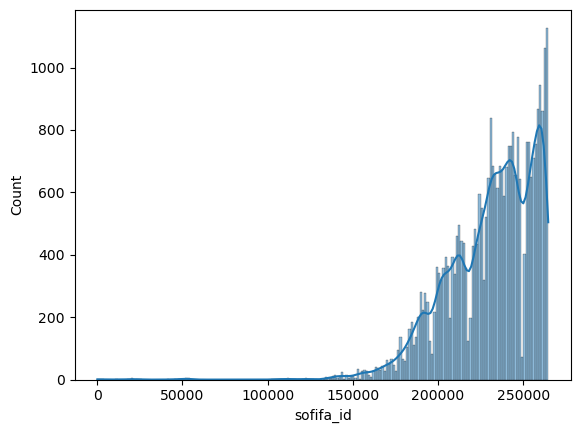

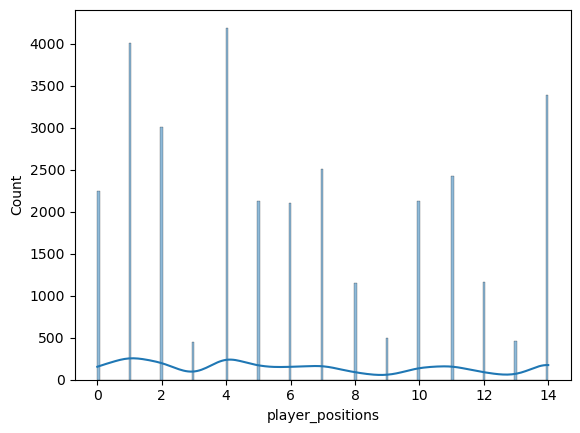

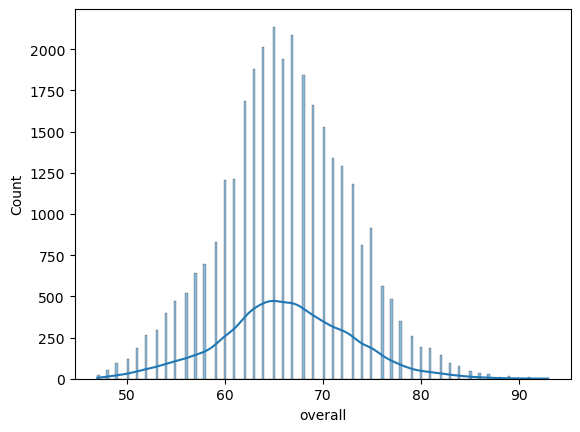

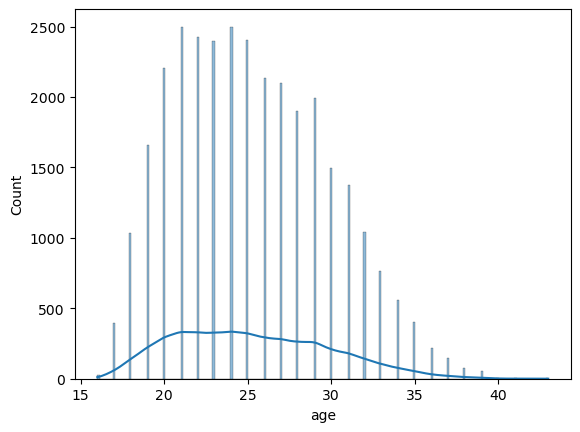

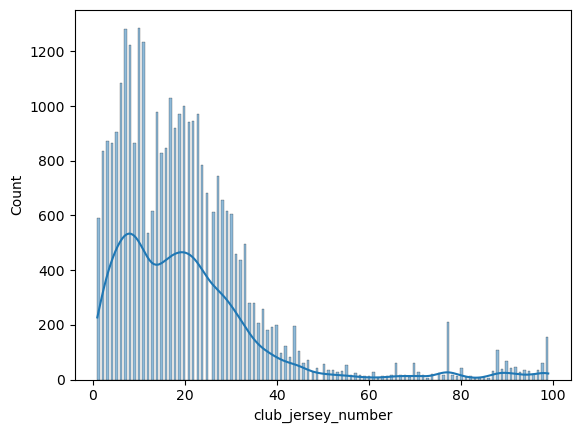

...

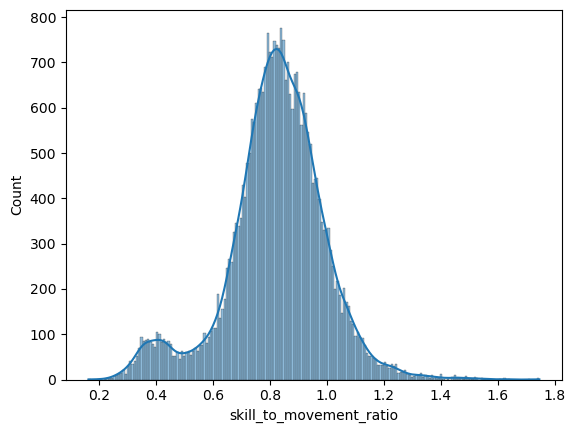

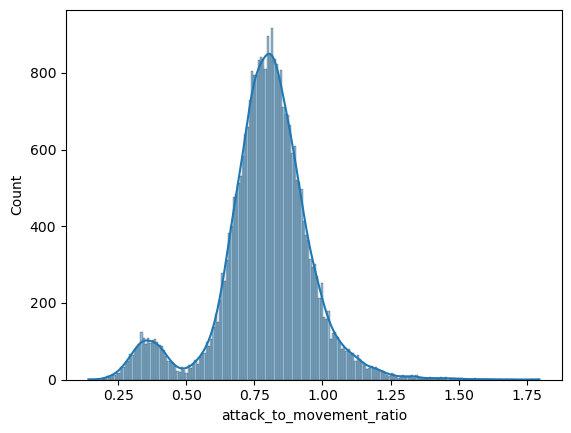

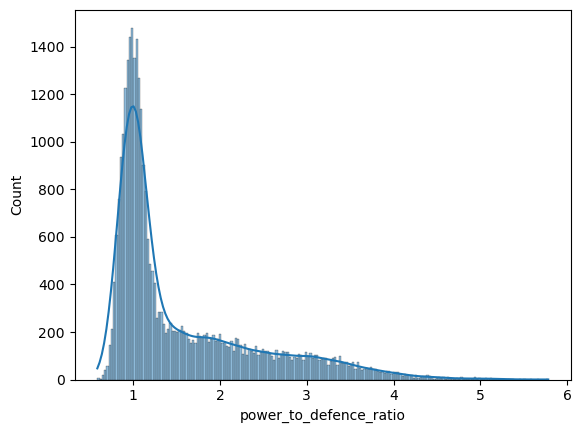

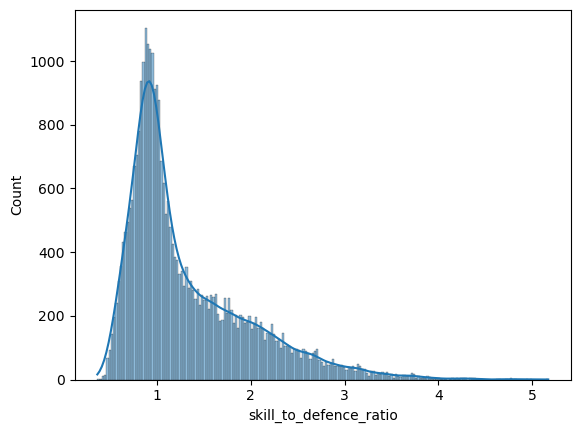

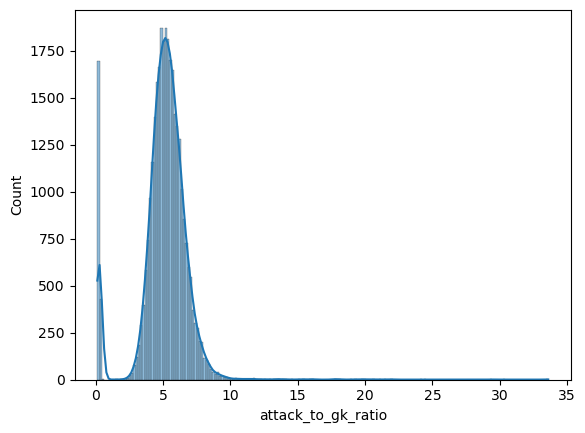

In [36]:
for feature in df.columns:
    fig, ax = plt.subplots()  # Створення окремого графіку
    sns.histplot(df[feature], kde=True, bins=200, ax=ax)  # Використання параметру ax для вказівки підграфіку
    plt.show()  # Відображення графіку

In [37]:
id = df.sofifa_id
df = df.drop(columns='sofifa_id')

In [39]:
columns_restore = df.columns

In [41]:
df.drop(columns='sofifa_id', inplace=True, errors='ignore')
X = df.drop(columns='player_positions')
Y = df.player_positions
# df = pd.concat([X_RES, Y_RES], axis=1)

X_train, X_temp, Y_train, Y_temp = train_test_split(X, Y, train_size=0.8, random_state=0)
X_valid, X_test, Y_valid, Y_test = train_test_split(X_temp, Y_temp, test_size=0.5, random_state=0)

X_train_sampled, Y_train_sampled = oversample(X_train, Y_train)

del X_temp, Y_temp

scaler = StandardScaler()
X_train_sampled = scaler.fit_transform(X_train_sampled)

# df = pd.DataFrame(df, columns=columns_restore)
# X_RES = pd.DataFrame(X_RES, columns=df.drop(columns='player_positions').columns)
# Y_RES = pd.DataFrame(Y_RES, columns=['player_positions'])
# df = pd.concat([X_RES, Y_RES], axis=1)

In [42]:
forest_model = RandomForestClassifier(n_estimators=800)

forest_model.fit(X_train_sampled, Y_train_sampled)
predictions = forest_model.predict(X_valid)
accuracy_score(Y_valid, predictions)
predictions = forest_model.predict(X_test)
accuracy_score(Y_test, predictions)

/Users/home/anaconda3/lib/python3.10/site-packages/sklearn/base.py:413: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
/Users/home/anaconda3/lib/python3.10/site-packages/sklearn/base.py:413: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


0.06691800188501414

In [7]:
logistic_model = LogisticRegression(max_iter=1000, solver='newton-cg')

logistic_model.fit(X_train, Y_train)
predictions = logistic_model.predict(X_valid)
accuracy_score(Y_valid, predictions)

0.4786827871460388

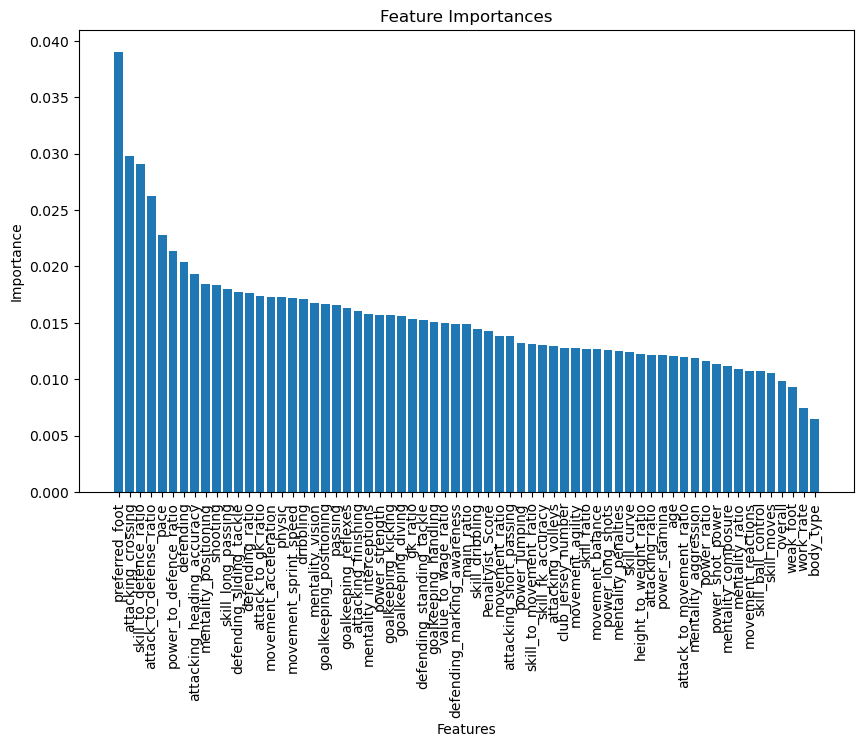

In [20]:
importances = forest_model.feature_importances_

# Sort features in descending order of importance
sorted_indices = np.argsort(importances)[::-1]
sorted_features = X_train.columns[sorted_indices]

# Create a bar plot of feature importances
plt.figure(figsize=(10, 6))
plt.bar(sorted_features, importances[sorted_indices])
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.show()


In [22]:
sorted_features

Index(['preferred_foot', 'attacking_crossing', 'skill_to_defence_ratio',
       'attack_to_defense_ratio', 'pace', 'power_to_defence_ratio',
       'defending', 'attacking_heading_accuracy', 'mentality_positioning',
       'shooting', 'skill_long_passing', 'defending_sliding_tackle',
       'defending_ratio', 'attack_to_gk_ratio', 'movement_acceleration',
       'physic', 'movement_sprint_speed', 'dribbling', 'mentality_vision',
       'goalkeeping_positioning', 'passing', 'goalkeeping_reflexes',
       'attacking_finishing', 'mentality_interceptions', 'power_strength',
       'goalkeeping_kicking', 'goalkeeping_diving', 'gk_ratio',
       'defending_standing_tackle', 'goalkeeping_handling',
       'value_to_wage_ratio', 'defending_marking_awareness', 'main_ratio',
       'skill_dribbling', 'Penaltyist_Score', 'movement_ratio',
       'attacking_short_passing', 'power_jumping', 'skill_to_movement_ratio',
       'skill_fk_accuracy', 'attacking_volleys', 'club_jersey_number',
       'mov

In [24]:
X = df.drop(columns=['player_positions','attacking_short_passing', 'power_jumping', 'skill_to_movement_ratio',
       'skill_fk_accuracy', 'attacking_volleys', 'club_jersey_number',
       'movement_agility', 'skill_ratio', 'movement_balance',
       'power_long_shots', 'mentality_penalties', 'skill_curve',
       'height_to_weight_ratio', 'attacking_ratio', 'power_stamina', 'age',
       'attack_to_movement_ratio', 'mentality_aggression', 'power_ratio',
       'power_shot_power', 'mentality_composure', 'mentality_ratio',
       'movement_reactions', 'skill_ball_control', 'skill_moves', 'overall',
       'weak_foot', 'work_rate', 'body_type'])
Y = df.player_positions

X_train, X_temp, Y_train, Y_temp = train_test_split(X, Y, train_size=0.8, random_state=0)
X_valid, X_test, Y_valid, Y_test = train_test_split(X_temp, Y_temp, test_size=0.5, random_state=0)

del X_temp, Y_temp

forest_model = RandomForestClassifier(n_estimators=1200)

forest_model.fit(X_train, Y_train)
predictions = forest_model.predict(X_valid)
accuracy_score(Y_valid, predictions)

0.525294304804327

<function matplotlib.pyplot.show(close=None, block=None)>

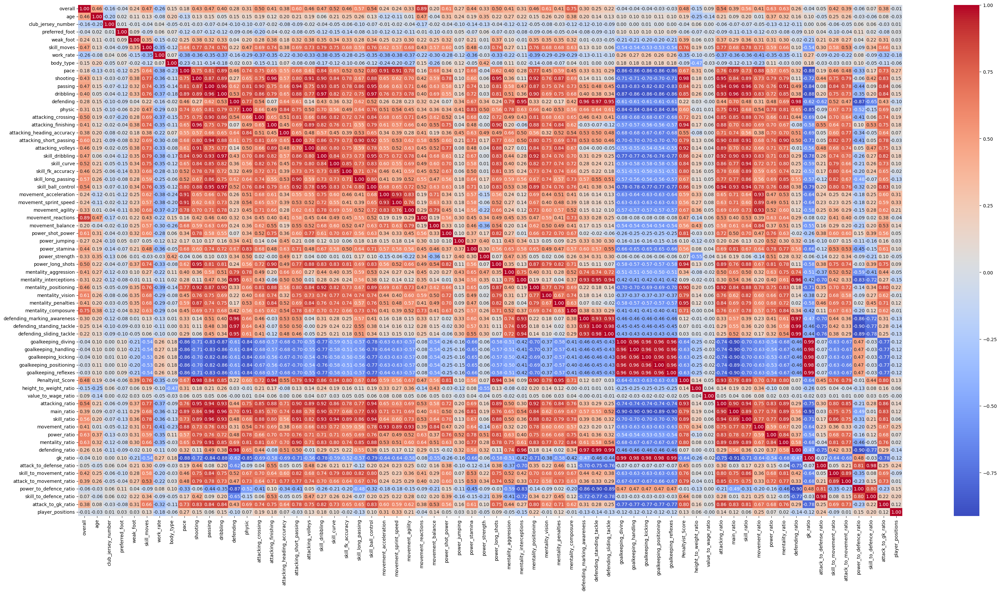

In [26]:
corr = df.corr()

plt.figure(figsize=(40, 20))
sns.heatmap(data=corr, fmt='.2f', cmap='coolwarm', annot=True)
plt.show

In [27]:
df_logistic = df.drop(
    columns=['shooting', 'dribbling', 'physic', 'attacking_finishing', 'attacking_short_passing', 'skill_dribbling', 
    'skikk_fk_accuracy', 'skill_ball_contol', 'movement_acceleration',
    'mentality_agility','power_long_shots', 'mentality_interceptions',
    'mentality_positioning', 'defending_marking_awareness', 'defending_sliding_tackle',
    'goalkeeping_handling', 'goalkeeping_positioning', 'height_to_weight_ratio', 
    'value_to_wage_ratio'], errors='ignore')

X = df_logistic.drop(columns='player_positions')
Y = df_logistic.player_positions

X_train, X_temp, Y_train, Y_temp = train_test_split(X, Y, train_size=0.8, random_state=0)
X_valid, X_test, Y_valid, Y_test = train_test_split(X_temp, Y_temp, test_size=0.5, random_state=0)

del X_temp, Y_temp

In [30]:
logistic_model = LogisticRegression(max_iter=1000, solver='newton-cg', multi_class='multinomial')

logistic_model.fit(X_train, Y_train)
predictions = logistic_model.predict(X_valid)
accuracy_score(Y_valid, predictions)
predictions = logistic_model.predict(X_test)
accuracy_score(Y_test, predictions)

0.4706537299188802

In [31]:
logistic_cv = LogisticRegressionCV(cv=5, Cs=10, solver='newton-cg', multi_class='multinomial')
logistic_cv.fit(X_train, Y_train)
predictions = logistic_cv.predict(X_valid)
accuracy_score(Y_valid, predictions)
predictions = logistic_cv.predict(X_test)
accuracy_score(Y_test, predictions)

/Users/home/anaconda3/lib/python3.10/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(


KeyboardInterrupt: 